## Import descarteslabs library to get the change rate of field area in 2016

In [1]:
'''
Created on Mar 25, 2017

Author: Jianfa Lin
'''

from __future__ import print_function
from IPython.display import display, Image
# Load up matplotlib and pyplot for plotting things.
%matplotlib inline
import matplotlib.pyplot as plt

# The main import for the descarteslabs python client is "descarteslabs"
import descarteslabs as dl
# This instantiates a few of our api clients and authenticates. If you
# get and error when importing, make sure that you either have the
# CLIENT_ID and CLIENT_SECRET set in your enviornment or have used the
# `descarteslabs login` mechanism on the command line.

# The first client API we'll go through is centered around metadata of
# satellite imagery: how to search our data corpus, get information about
# various resources, and summarize them. 

In [8]:
# Let's set up an alias here
metadata = dl.metadata

sources = metadata.sources()

In [9]:
# Sources are each individual satellite, which can belong to a parent 
# constellation, which is sometimes easier to think about.

constellations = set([s['const_id'] for s in sources])

### Get a collectiong of images aroung given location

In [122]:
dlkey = dl.raster.dlkey_from_latlon(32.5129080, -8.7083085, 10.0, 2048, 32)
dlkey

{u'geometry': {u'coordinates': [[[-8.785653891755368, 32.38994781854278],
    [-8.561105043647935, 32.389366009036095],
    [-8.560179282764093, 32.57988646511539],
    [-8.785201758119458, 32.580472537026715],
    [-8.785653891755368, 32.38994781854278]]],
  u'type': u'Polygon'},
 u'properties': {u'cs_code': u'EPSG:32629',
  u'key': u'2048:32:10.0:29:1:175',
  u'outputBounds': [520160.0, 3583680.0, 541280.0, 3604800.0],
  u'pad': 32,
  u'resolution': 10.0,
  u'ti': 1,
  u'tilesize': 2048,
  u'tj': 175,
  u'zone': 29},
 u'type': u'Feature'}

In [142]:
import json
# Let's search for imagery over that DLKey:
dlkey_sources = metadata.search(const_id=["S2A"],
                                start_time='2016-01-01',
                                end_time='2016-02-01',
                                geom=json.dumps(dlkey['geometry']),
)

In [166]:
len(dlkey_sources['features'])


12

In [125]:
features = dlkey_sources['features']
sorted_by_date = sorted(features, key=lambda a: a['properties']['acquired'])
print([s['properties']['acquired'] for s in sorted_by_date[:5]])
multiple_ids = [s['id'] for s in dlkey_sources['features'][:39]]

[u'2016-01-01T11:39:35.756Z', u'2016-01-01T11:39:35.756Z', u'2016-01-08T11:24:32.827Z', u'2016-01-08T11:24:32.827Z', u'2016-01-11T11:33:19.193Z']


In [95]:
print (dlkey_sources)

{'type': 'FeatureCollection', 'features': [{u'geometry': {u'type': u'Polygon', u'coordinates': [[[-10.1270361, 32.7750781], [-8.2160589, 32.3908668], [-8.7003896, 30.6959865], [-10.5727243, 31.0799542], [-10.1270361, 32.7750781]]]}, u'type': u'Feature', u'properties': {u'acquired': u'2016-01-29T11:10:23.661490Z', u'cs_code': u'EPSG:32629', u'raster_size': [15376, 15680], u'solar_azimuth_angle': 150.65034715, u'file_sizes': [47636789, 27069559], u'terrain_correction': u'L1T', u'cloud_fraction_0': 0.6115, u'reflectance_scale': [0.2638, 0.2587, 0.2826, 0.3336, 0.5498, 2.1827, 6.7096, 1.3379, 0.2962], u'files': [u'2016-01-29_203038_L8_432.jp2', u'2016-01-29_203038_L8_567_19a.jp2'], u'geolocation_accuracy': 3.008, u'solar_elevation_angle': 34.74634768, u'descartes_version': u'satin-0.8.2.1', u'roll_angle': -0.001, u'tile_id': u'203038', u'sw_version': u'LPGS_2.6.0', u'identifier': u'LC82030382016029LGN00.tar.bz', u'projcs': u'WGS 84 / UTM zone 29N', u'bucket': u'gs://descartes-l8/', u'proce

In [164]:
import numpy as np
stack = None
for index, this_id in enumerate(multiple_ids):
    arr, meta = dl.raster.ndarray(
        this_id,
        bounds=dlkey['properties']['outputBounds'],
        resolution = dlkey['properties']['resolution'],
        bands=['ndvi', 'alpha'],
        data_type='UInt16',
    )
    print (arr.shape[0])
    if stack is None:
        stack = np.zeros((arr.shape[0],arr.shape[1], len(multiple_ids) ))

    stack[:,:,index] = arr[:, :, 0]& arr[:, :, 1] 
    
    print(arr.shape)

#     plt.figure(figsize=[16,16])
#     plt.imshow(arr[:, :, 0] / 32768. -1.0, cmap='BrBG', vmin=0.3, vmax=0.8)
#     plt.colorbar()

2112
(2112, 2112, 2)
2112
(2112, 2112, 2)
2112
(2112, 2112, 2)
2112
(2112, 2112, 2)
2112
(2112, 2112, 2)
2112
(2112, 2112, 2)
2112
(2112, 2112, 2)
2112
(2112, 2112, 2)


In [163]:
# plt.plot(stack[1850,1550,:])
print(len(stack))
print(np.mean(stack[:,:,12]))
# plt.imshow(stack[:,:,8])
# plt.figure(figsize=[16,16])
# plt.imshow(arr[:, :, 0] / 32768. -1.0, cmap='BrBG', vmin=0.0, vmax=1.0)
# plt.colorbar()

2112
31044.1865266


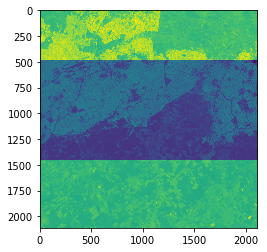

In [130]:
mask = np.std(stack,2)
plt.imshow(mask)

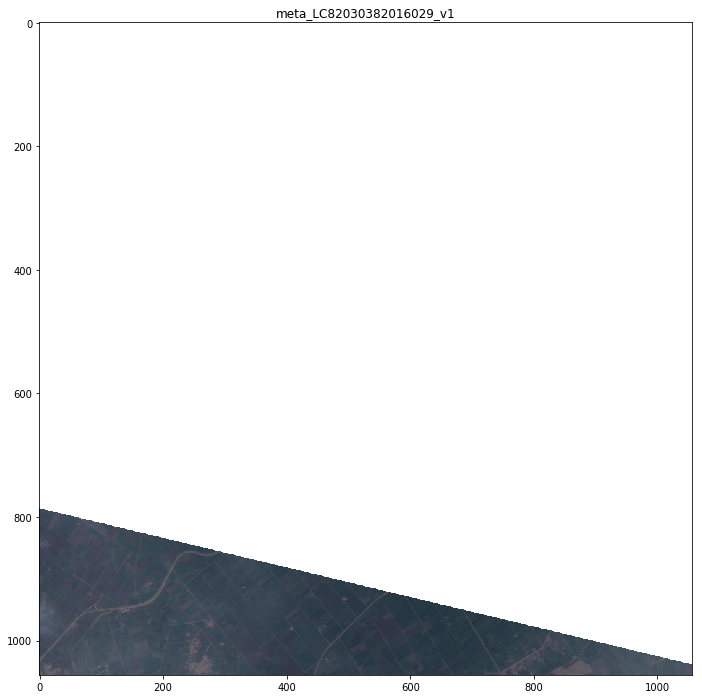

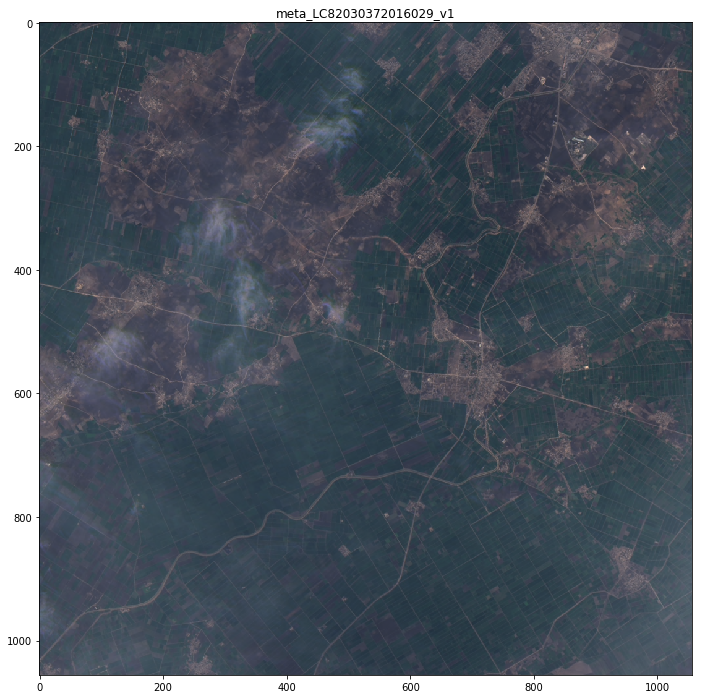

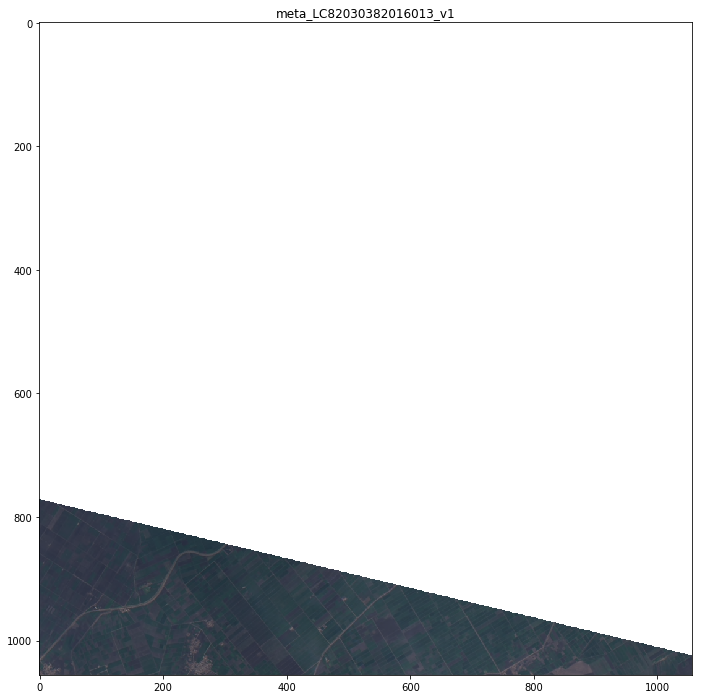

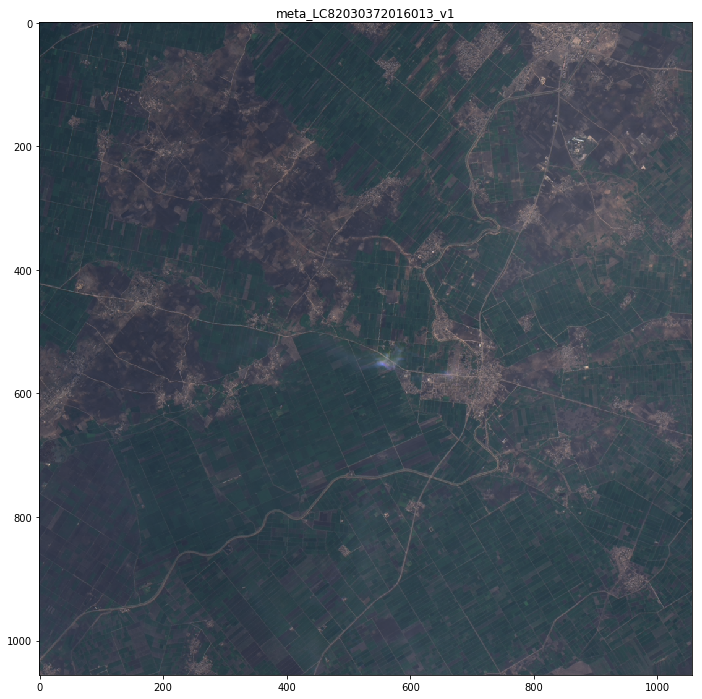

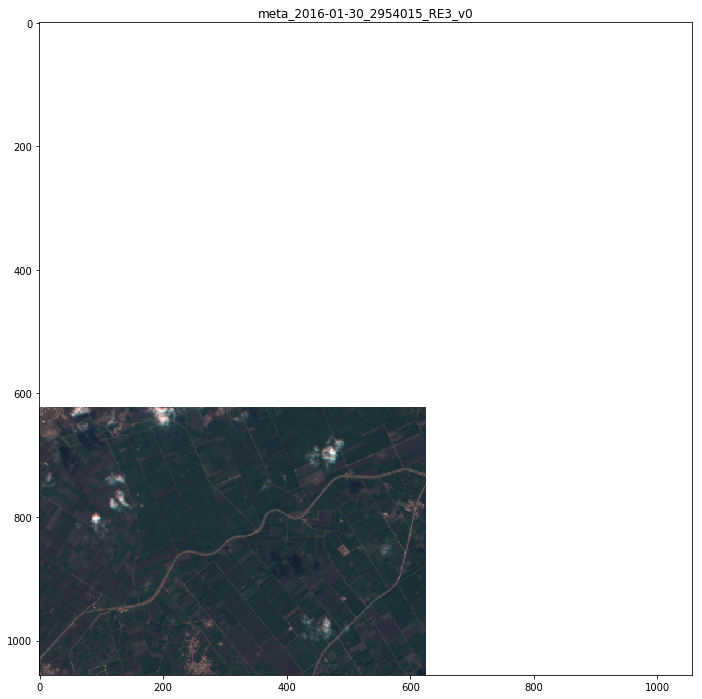

...

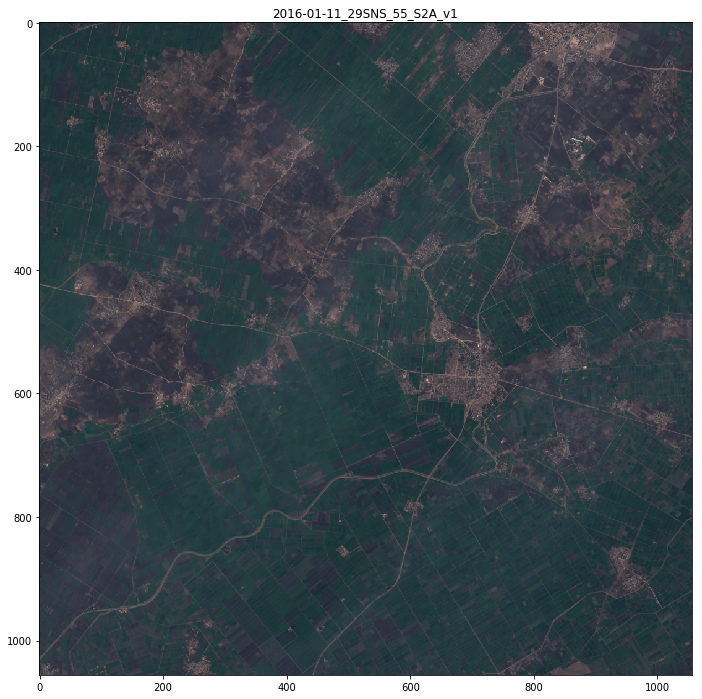

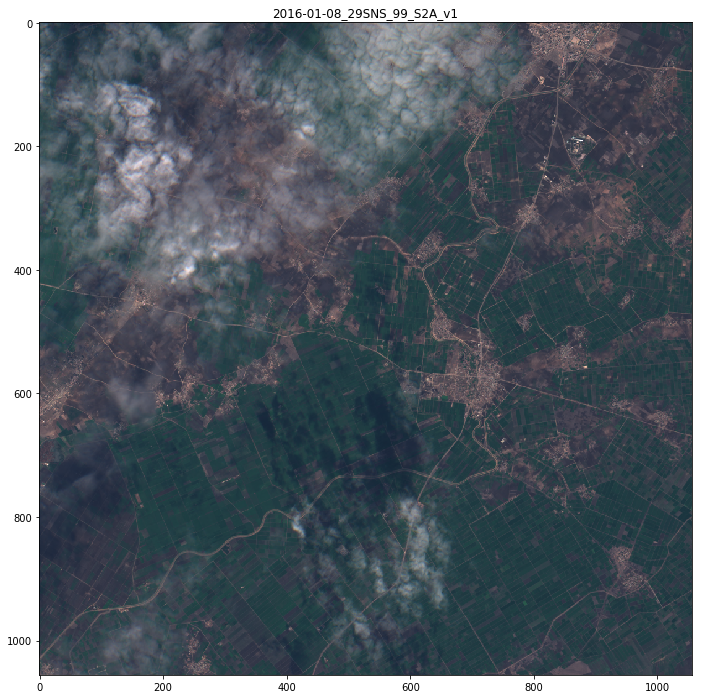

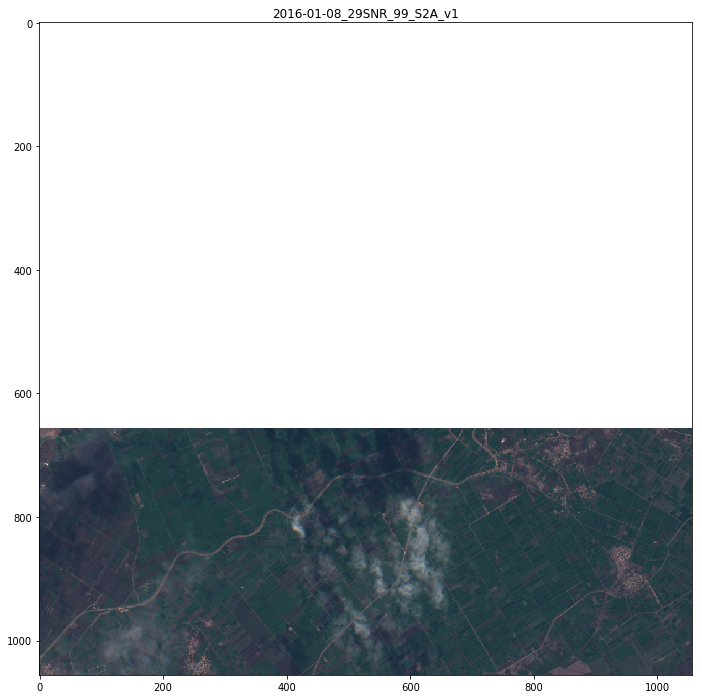

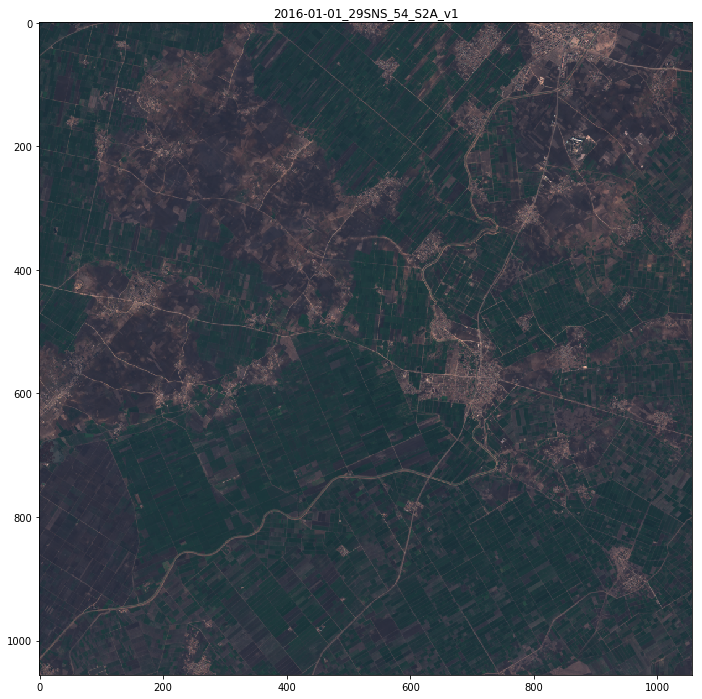

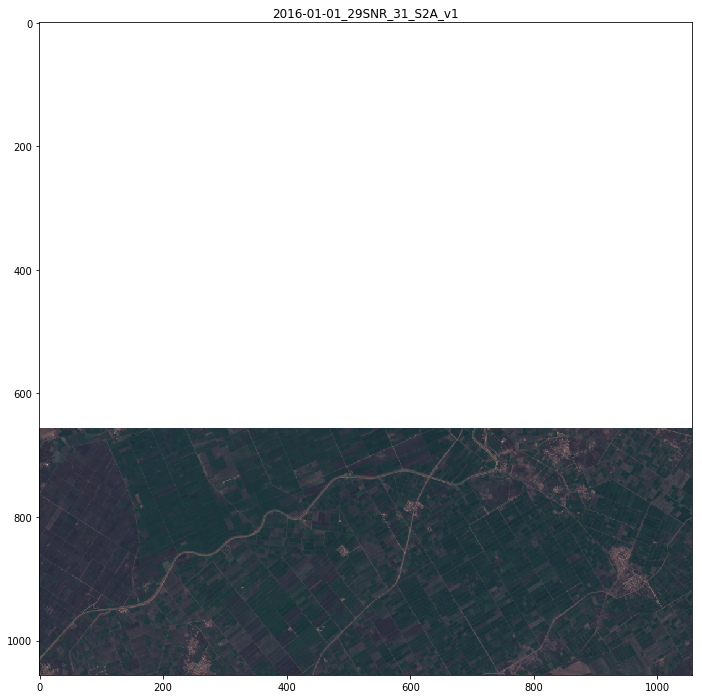

In [31]:
# This will actually loop through all 39 scenes that intersect that DLKey from
# Landsat 8, Sentinel-2A, and RapidEye, co-register all the data onto the
# same resolution and coordinate system, and display the red, green, and blue
# channels. A follow-up to this example would be to mosaic either same-day or
# nearby days of each satellite together, since some scene products don't cover the 
# entire DLKey.
for source in dlkey_sources['features']:
    this_scene = source['id']
    arr, meta = dl.raster.ndarray(
        this_scene,
        resolution=dlkey['properties']['resolution'],
        bounds=dlkey['properties']['outputBounds'],
        srs=dlkey['properties']['cs_code'], 
        bands=['red', 'green', 'blue', 'alpha'],
        scales=[[0, 4000], [0, 4000], [0, 4000], None],
        data_type='Byte',
    )
    plt.figure(figsize=[12,12])
    plt.imshow(arr)
    plt.title(this_scene)

# Here is the trying for getting the change rate of one place btw two months

In [186]:
dlkey = dl.raster.dlkey_from_latlon(33.2930708, -7.5303315, 10.0, 2048, 32)
dlkey

{u'geometry': {u'coordinates': [[[-7.686249788614466, 33.12218152130743],
    [-7.459925178967925, 33.11958938731942],
    [-7.456584965007261, 33.310024008506225],
    [-7.683400067080742, 33.312634904177244],
    [-7.686249788614466, 33.12218152130743]]],
  u'type': u'Polygon'},
 u'properties': {u'cs_code': u'EPSG:32629',
  u'key': u'2048:32:10.0:29:6:179',
  u'outputBounds': [622560.0, 3665600.0, 643680.0, 3686720.0],
  u'pad': 32,
  u'resolution': 10.0,
  u'ti': 6,
  u'tilesize': 2048,
  u'tj': 179,
  u'zone': 29},
 u'type': u'Feature'}

In [187]:
import json
# Let's search for imagery over that DLKey:
counting = []

for i in range(1,13):
    if i < 9:
        start = "2016-0%d-01" % i
        end = "2016-0%d-01" % (i+1)
    elif i == 9:
        start = "2016-0%d-01" % i
        end = "2016-10-01"
    elif i < 12:
        start = "2016-%d-01" % i
        end = "2016-%d-01" % (i+1)
    else:
        start = "2016-12-01"
        end = "2016-12-31"
    dlkey_sources = metadata.search(const_id=["L8","S2A"],
                                    start_time=start,
                                    end_time=end,
                                    geom=json.dumps(dlkey['geometry']),
    )
    
    print("length of sources:", len(dlkey_sources['features']))
    
    # Here we're calculating NDVI == (NIR - RED)/(NIR + RED) on the fly.
    # It's scaled such that 0-65535 is equivalent to -1.0 to 1.0, so 
    # we're going to divide by 32768 and subtract 1.0
    multiple_ids = [s['id'] for s in dlkey_sources['features'][:]]
    arr, meta = dl.raster.ndarray(
            multiple_ids, resolution=240,
            bands=['ndvi', 'alpha'],
            data_type='UInt16',
    )

    count = 0
    print(arr.shape)
    for x in arr:
        for j in x:
            if 49152 <= j[0] < 58982:
                count += 1
    counting.append(count)
    
    print("PIC for month", i)

#     plt.figure(figsize=[16,16])
#     plt.imshow(arr[:, :, 0] / 32768. -1.0, cmap='BrBG', vmin=0.0, vmax=1.0)
#     plt.colorbar()
    
    

length of sources: 5
(970, 957, 2)
PIC for month 1
length of sources: 4
(970, 954, 2)
PIC for month 2
length of sources: 5
(970, 953, 2)
PIC for month 3
length of sources: 5
(970, 959, 2)
PIC for month 4
length of sources: 4
(970, 952, 2)
PIC for month 5
length of sources: 5
(970, 954, 2)
PIC for month 6
length of sources: 4
(970, 951, 2)
PIC for month 7
length of sources: 5
(970, 952, 2)
PIC for month 8
length of sources: 3
(970, 950, 2)
PIC for month 9
length of sources: 5
(970, 957, 2)
PIC for month 10
length of sources: 5
(970, 952, 2)
PIC for month 11
length of sources: 5
(970, 954, 2)
PIC for month 12


In [188]:
print(counting)

[52019, 30379, 14371, 46869, 13428, 11466, 1145, 2461, 269, 1454, 6905, 11172]


### Results of counting pixels in three different location
### 32.5129080, -8.7083085, 10.0, 2048, 32: [359943, 248930, 231847, 263634, 104161, 179155, 72293, 87337, 35207, 91191, 93941, 233049]
### 32.3296834, -6.6590752, 10.0, 2048, 32: [68487, 43684, 29111, 71588, 12874, 18523, 5332, 6025, 2411, 4004, 12990, 22142]
### 33.2930708, -7.5303315, 10.0, 2048, 32: [52019, 30379, 14371, 46869, 13428, 11466, 1145, 2461, 269, 1454, 6905, 11172]

(874, 458, 2)


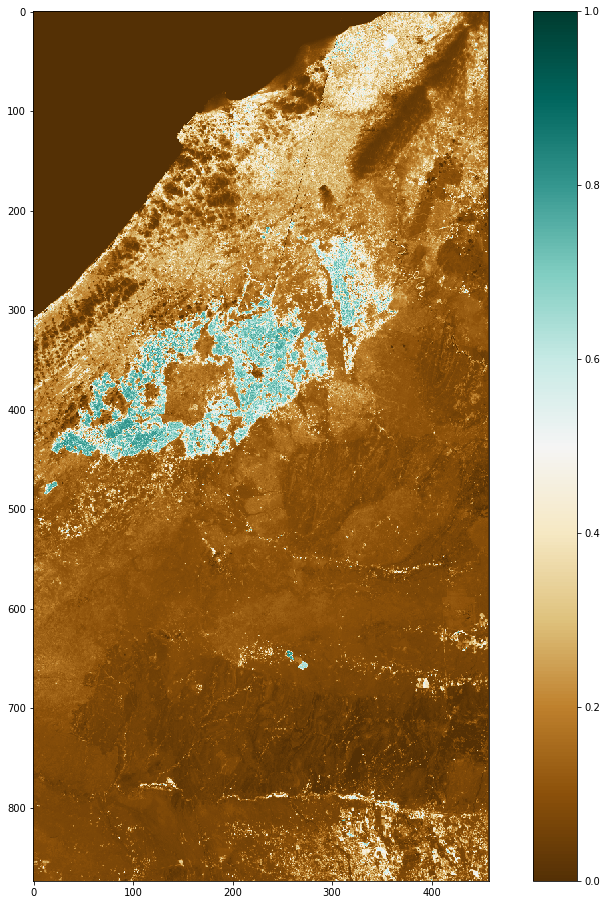

In [174]:
# dl.raster.dlkeys_from_shape(30, 2048, 32, )

# Here we're calculating NDVI == (NIR - RED)/(NIR + RED) on the fly.
# It's scaled such that 0-65535 is equivalent to -1.0 to 1.0, so 
# we're going to divide by 32768 and subtract 1.0
multiple_ids = [s['id'] for s in dlkey_sources['features'][:]]
arr, meta = dl.raster.ndarray(
        multiple_ids, resolution=240,
        bands=['ndvi', 'alpha'],
        data_type='UInt16',
)

print(arr.shape)

plt.figure(figsize=[16,16])
plt.imshow(arr[:, :, 0] / 32768. -1.0, cmap='BrBG', vmin=0.0, vmax=1.0)
plt.colorbar()

# Here is the example to show picture of doukkala-abda btw Jan-Apr

In [137]:
# Through the same interfaces you can merge multiple scenes together:
scenes = metadata.search(const_id=['L8'], shape='africa_morocco_doukkala-abda',
                        start_time='2016-01-01', end_time='2016-04-01')

# Make sure you use the 'alpha' band when combining multiple scenes together to make sure that
# the nodata regions are properly masked out. In addition, if there are scenes that overlap, the
# last image to be added to the mosaic is the one that is displayed on the top. 
multiple_ids = [s['id'] for s in scenes['features'][:8]]
arr, meta = dl.raster.ndarray(
        multiple_ids, resolution=480,
        bands=['red', 'green', 'blue', 'alpha'],
        scales=[[0, 4000], [0, 4000], [0, 4000], None],
        data_type='Byte',
)

22


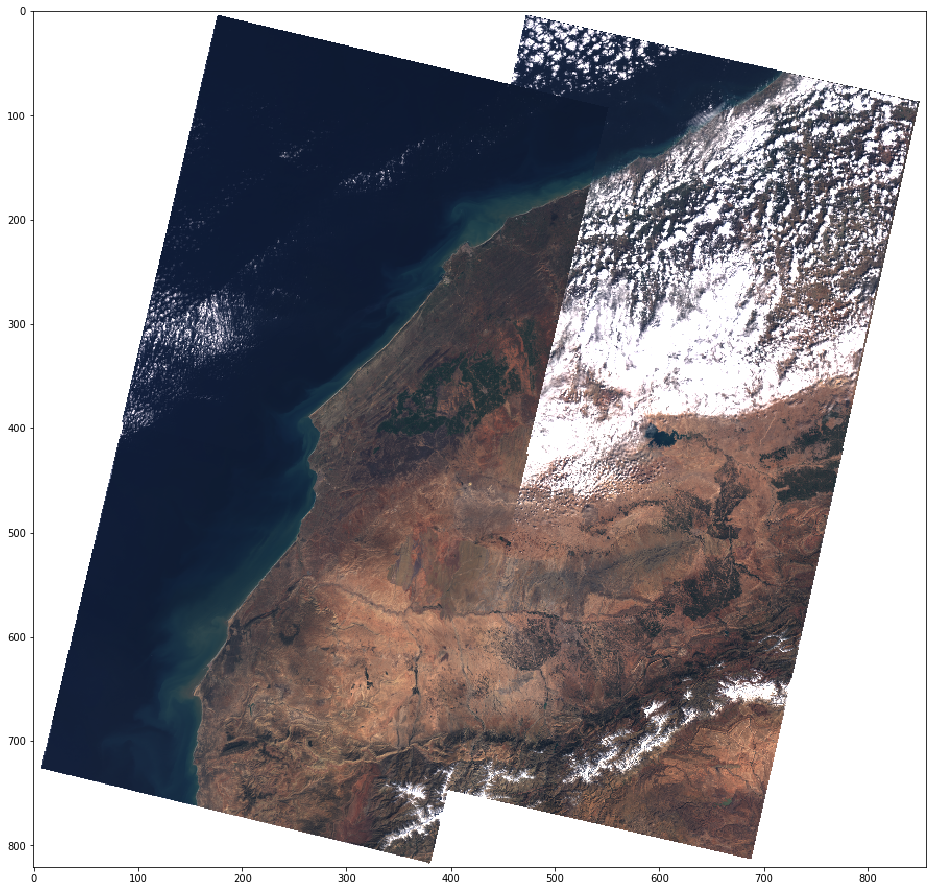

In [138]:
print(len(scenes['features']))
plt.figure(figsize=[16,16])
plt.imshow(arr)